In [25]:
from numpy.random import random_sample
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
import lime
import lime.lime_tabular
import pandas as pd
import sklearn.datasets as datasets
from IPython.display import Image

In [23]:
from data import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
url = 'data/adult.data'
url_test = 'data/adult.test'

# load  the training data from 
train_data = pd.read_csv(url,
                         header=None,
                         names=['age', 'workclass','fnlwgt','education','education_num','maritalstatus',
                                'occupation','relationship','race','sex','capital_gain','capital_loss',
                                'hours_per_week','native_country', 'income'],
                         na_values = ' ?')
train_data.head()


# load  the training data from 
test_data = pd.read_csv(url_test,
                         header=None,
                         names=['age', 'workclass','fnlwgt','education','education_num','maritalstatus',
                                'occupation','relationship','race','sex','capital_gain','capital_loss',
                                'hours_per_week','native_country', 'income'],
                         na_values = ' ?')
test_data.head()

,age,workclass,fnlwgt,education,education_num,maritalstatus,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,|1x3 Cross validator,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,25,Private,226802.0,11th,7.0,Never-married,Machine-op-inspct,Own-child,Black,Male,0.0,0.0,40.0,United-States,<=50K.
2,38,Private,89814.0,HS-grad,9.0,Married-civ-spouse,Farming-fishing,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K.
3,28,Local-gov,336951.0,Assoc-acdm,12.0,Married-civ-spouse,Protective-serv,Husband,White,Male,0.0,0.0,40.0,United-States,>50K.
4,44,Private,160323.0,Some-college,10.0,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688.0,0.0,40.0,United-States,>50K.


In [4]:
# for now just test the continous variables
test_data = test_data[['age', 'fnlwgt', 'education_num','capital_gain', 'capital_loss', 'hours_per_week','income']]
train_data = train_data[test_data.columns]

In [5]:
def preprocess_data(data):
    ''' Change the categorical columns to numeric '''
    data = data.dropna()
    data = data.drop_duplicates()
    for column in data.columns:
        if data[column].dtype == object:
            data[column] = data[column].astype('category').cat.codes
    return data.drop('income', axis=1), data['income']

In [6]:
X_train, Y_train = preprocess_data(train_data)
X_test, Y_test = preprocess_data(test_data)

In [7]:
def alter(values):
    return np.array([[i, 1-i] for i in values])

def get_linear_lime_predictor(predictor):
    return lambda x: alter(predictor(x))

In [8]:
reg = LogisticRegression(solver='liblinear')
reg = reg.fit(X_train, Y_train)
reg.coef_
predictor = get_linear_lime_predictor(reg.predict)
X = np.array(X_test)
X_train.head()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
0,39,77516,13,2174,0,40
1,50,83311,13,0,0,13
2,38,215646,9,0,0,40
3,53,234721,7,0,0,40
4,28,338409,13,0,0,40


In [9]:
best_kMeans, best_labels, best_n = divide_samples(X)

For n_clusters = 2 The average silhouette_score is : 0.5824265105960805
For n_clusters = 3 The average silhouette_score is : 0.5497149574086188
For n_clusters = 4 The average silhouette_score is : 0.551506615928567
For n_clusters = 5 The average silhouette_score is : 0.5356009807808324
For n_clusters = 6 The average silhouette_score is : 0.539797163323549
For n_clusters = 7 The average silhouette_score is : 0.5444778621751086
For n_clusters = 8 The average silhouette_score is : 0.5388115100209057
For n_clusters = 9 The average silhouette_score is : 0.5306645652597388
For n_clusters = 10 The average silhouette_score is : 0.5298124177965755


In [12]:
predictions = np.array(Y_test)

In [13]:
clusters = divide_samples_by_labels(X, best_labels, best_n, predictions)

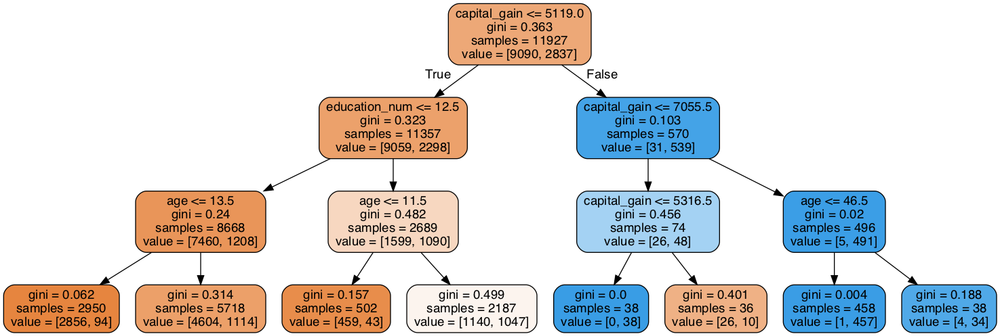

In [29]:
feature_names = X_train.columns
trees = get_trees_from_clusters(clusters)
graph = visualize_tree(trees[0], feature_names)
Image(graph.create_png())

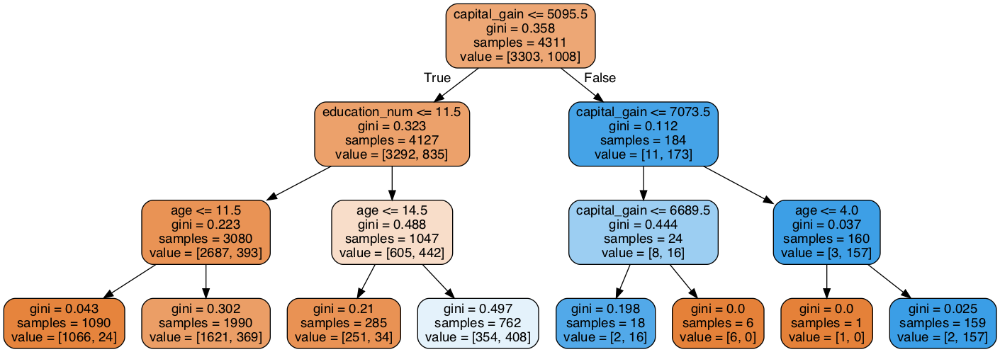

In [30]:
graph = visualize_tree(trees[1], feature_names)
Image(graph.create_png())

In [32]:
from data import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
[3.40000e+01 1.89762e+05 1.00000e+01 0.00000e+00 0.00000e+00 1.80000e+01]


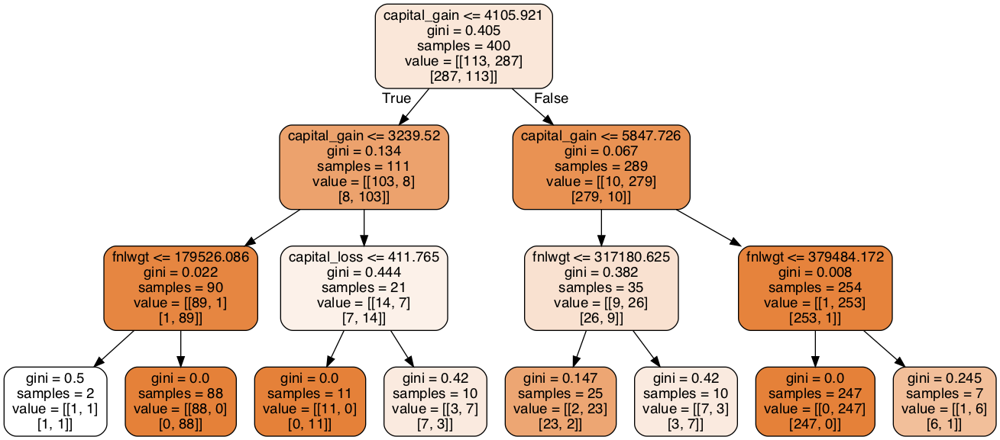

In [29]:
x,y = get_points_around(X[600], predictor, X, samples_size=400)
x = pd.DataFrame(x)
x.columns = X_train.columns
clf = predict_tree(x, y)
feature_names = x.columns
graph = visualize_tree(clf, feature_names)
Image(graph.create_png())

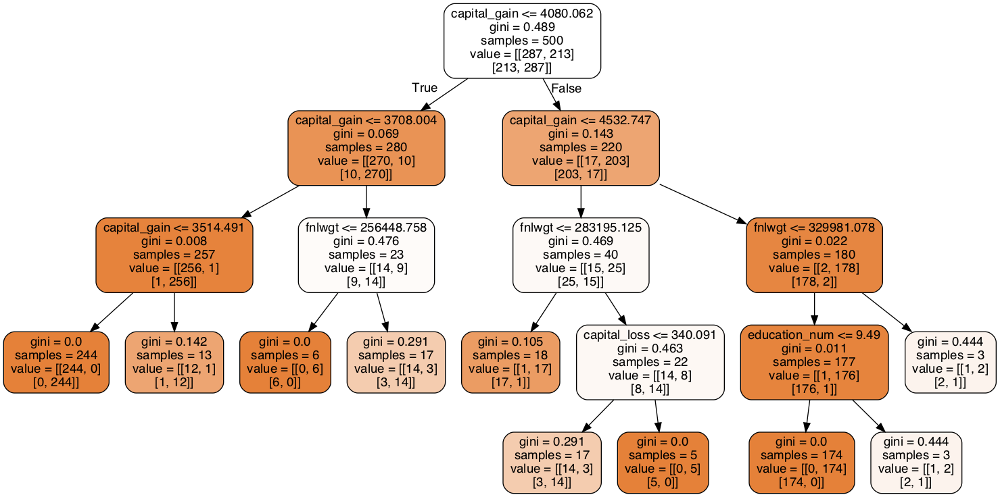

In [79]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=False,
               feature_names=train_data.columns.drop('income'))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [11]:
for i, w in enumerate(reg.coef_[0]):
    print(i, X_train.columns[i], w)

0 age 0.017529586343008708
1 workclass -0.009122573580970534
2 fnlwgt -1.5311246247519696e-06
3 education -0.011566925157596256
4 education_num 0.029630283400715163
5 maritalstatus -0.032956734751644005
6 occupation -0.0052397689285250786
7 relationship -0.0373282015990355
8 race -0.009201533945682284
9 sex 0.00568050243553891
10 capital_gain 0.00032764186060748555
11 capital_loss 0.0007616967739432936
12 hours_per_week 0.01880815489788598
13 native_country -0.06956805649565112


In [12]:
reg.score(X_train, Y_train)

0.7866551644049239

In [13]:
X_train.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'maritalstatus', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country'],
      dtype='object')

In [14]:
explainer = lime.lime_tabular.LimeTabularExplainer (np.array(X_train), 
                                                   feature_names=X_train.columns, 
                                                   class_names=["Above 50K", "Below 50K"],
                                                   discretize_continuous=True,
                                                   mode="classification")

/Users/alnouralharin/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [15]:
def alter(values):
    return np.array([[i, 1-i] for i in values])

def get_linear_lime_predictor(predictor):
    return lambda x: alter(predictor(x))

In [16]:
predictor = get_linear_lime_predictor(reg.predict)

In [17]:
for x in range(10):
    test_explain = np.array(X_test)
    i = np.random.randint(0, test_explain.shape[0])
    print("Current Sample", test_explain[i])
    exp = explainer.explain_instance(test_explain[i], predictor, num_features=4, top_labels=1, num_samples=500)
    exp.show_in_notebook(show_table=True, show_all=False)
    print("----------------------------------------")

Current Sample [1.5000e+01 2.0000e+00 7.0377e+04 1.4000e+01 1.5000e+01 4.0000e+00
 9.0000e+00 1.0000e+00 4.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 4.0000e+01 3.7000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  2  1]
scores are [ 0.56526758  0.56417627 -0.0525065   0.0570028 ]


----------------------------------------
Current Sample [3.30000e+01 2.00000e+00 2.56908e+05 1.00000e+01 1.60000e+01 2.00000e+00
 1.10000e+01 0.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00
 5.00000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  3  9]
scores are [0.51751064 0.50130783 0.04793264 0.04851034]


----------------------------------------
Current Sample [3.10000e+01 2.00000e+00 1.03406e+05 9.00000e+00 1.30000e+01 2.00000e+00
 1.20000e+01 0.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00
 3.50000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  4  3]
scores are [ 0.72753121  0.52501777 -0.01347674 -0.0106534 ]


----------------------------------------
Current Sample [1.30000e+01 2.00000e+00 2.03181e+05 8.00000e+00 1.10000e+01 4.00000e+00
 3.00000e+00 3.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00
 3.60000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11 12  5]
scores are [0.70401404 0.43007503 0.05182221 0.02881795]


----------------------------------------
Current Sample [1.60000e+01 2.00000e+00 1.30057e+05 7.00000e+00 1.20000e+01 2.00000e+00
 1.10000e+01 0.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 0.00000e+00
 4.50000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11 12  6]
scores are [ 0.63056267  0.38624745 -0.04416442  0.02805221]


----------------------------------------
Current Sample [2.90000e+01 2.00000e+00 1.85041e+05 1.50000e+01 1.00000e+01 2.00000e+00
 3.00000e+00 0.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 1.90200e+03
 5.00000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11 12  2]
scores are [-0.6869379   0.36536488  0.08342024  0.03971653]


----------------------------------------
Current Sample [3.000e+01 2.000e+00 5.938e+04 1.500e+01 1.000e+01 0.000e+00 0.000e+00
 4.000e+00 4.000e+00 0.000e+00 0.000e+00 0.000e+00 4.200e+01 3.700e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  0  5]
scores are [ 0.72025727  0.52943596  0.0264335  -0.01905934]


----------------------------------------
Current Sample [2.50000e+01 2.00000e+00 2.30355e+05 1.50000e+01 1.00000e+01 5.00000e+00
 0.00000e+00 1.00000e+00 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 4.00000e+01 4.00000e+00]
Explain instance has been called
labels are (1,)
used features are [10 11 12  2]
scores are [-0.65623341 -0.44151639 -0.05488013  0.03313839]


----------------------------------------
Current Sample [7.0000e+00 2.0000e+00 1.9313e+05 1.5000e+01 1.0000e+01 4.0000e+00
 0.0000e+00 3.0000e+00 4.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 4.0000e+01 3.7000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  7  6]
scores are [0.60843698 0.45481524 0.03469002 0.02082925]


----------------------------------------
Current Sample [4.10000e+01 2.00000e+00 1.00054e+05 9.00000e+00 1.30000e+01 2.00000e+00
 1.10000e+01 0.00000e+00 4.00000e+00 1.00000e+00 0.00000e+00 1.90200e+03
 7.00000e+01 3.70000e+01]
Explain instance has been called
labels are (1,)
used features are [10 11  2  9]
scores are [-0.65851488  0.431449    0.03773195 -0.01836311]


----------------------------------------
